In [1]:
using Random
using Distributions
using Turing
using Turing.RandomMeasures: stickbreak, DirichletProcess, StickBreakingProcess, ChineseRestaurantProcess
using StatsBase, StatsFuns, StatsModels, StatsPlots, Statistics
using Test
import Debugger
using CSV,DataFrames

Random.seed!(1234)


MersenneTwister(1234)

In [2]:
include("PlottingUtils.jl")
using .PlottingUtils.syntheticDataPlotting
using .PlottingUtils.turingChainPlotting
include("MathUtils.jl")
using .MathUtils
include("InferenceUtils.jl")
using .InferenceUtils.customInfernce
using .InferenceUtils.turingInferenceModels
using .InferenceUtils.turingChainProcessing
include("DataGenUtils.jl")
using .DataGenerationUtils.customSyntheticDataGeneration
using .DataGenerationUtils.turingSytheticDataGeneration
include("DataPreprocessUtils.jl")
using .DataPreprocessingUtils.syntheticDataPreprocessing

### Data: 1 Gene NB likelihood mu = [2,4,6]; Model= independent DP

In [30]:
k = 3
T = 4
Cₜ =  2*ones(Int,T) #[2,2,2,2]
μ = [2.,4.,6.]
σ² = 10.0*ones(k)
truth_dict1, data_dict1 = generate1Phen_SimpleCase1()

(Dict{Tuple, Float64}((1, 2) => 2.0, (3, 1) => 1.0, (6, 2) => 1.0, (1, 3) => 1.0, (6, 3) => 2.0, (1, 4) => 1.0, (6, 4) => 3.0, (3, 2) => 3.0, (3, 3) => 2.0, (4, 1) => 1.0…), Dict{Tuple, VecOrMat{T} where T}((1, 2) => [5], (3, 1) => [0], (6, 2) => [0], (1, 3) => [0], (6, 3) => [3], (1, 4) => [5], (6, 4) => [7], (3, 2) => [11], (3, 3) => [5], (4, 1) => [3]…))

In [31]:
C_t = [6,6,6,6]

4-element Vector{Int64}:
 6
 6
 6
 6

In [33]:
burn = 1000  # NOTE: The burn in is also returned. Can't be discarded.
n_samples = 1500
PG_param = 100
# iterations = burn + n_samples
x1 = [[data_dict1[(i,t)][1] for i in 1:C_t[t]] for t in 1:T]
true_clusters1 = [[truth_dict1[(i,t)] for i in 1:C_t[t]] for t in 1:T]
coordinates = [[(i,t) for i in 1:C_t[t]] for t in 1:T]
K = 12
true_k = 3
T = 4
m1=timeseries_indep_dp_pmm1(x, T, K;a_θ = 0.5)

DynamicPPL.Model{Main.InferenceUtils.turingInferenceModels.var"#2#4", (:x, :T, :K, :a_θ, :b_θ, :a, :b), (:a_θ, :b_θ, :a, :b), (), Tuple{Vector{Vector{Int64}}, Int64, Int64, Float64, Int64, Int64, Int64}, NTuple{4, Int64}, DynamicPPL.DefaultContext}(:timeseries_indep_dp_pmm1, Main.InferenceUtils.turingInferenceModels.var"#2#4"(), (x = [[2, 4, 0, 3, 2, 18], [5, 0, 11, 2, 0, 0], [0, 6, 5, 0, 9, 3], [5, 1, 0, 7, 13, 7]], T = 4, K = 12, a_θ = 0.5, b_θ = 1, a = 6, b = 1), (a_θ = 1, b_θ = 1, a = 6, b = 1), DynamicPPL.DefaultContext())

In [34]:
@time PG_chain1 = begin
    burnin = burn  # NOTE: The burn in is also returned. Can't be discarded.
    post_samples = n_samples
    iterations = burnin + post_samples
    PG_param = PG_param
 
    tchain1 = sample(m1, 
            PG(PG_param),
           iterations, progress=false)
end;

432.499331 seconds (1.31 G allocations: 145.571 GiB, 8.24% gc time, 0.75% compilation time)


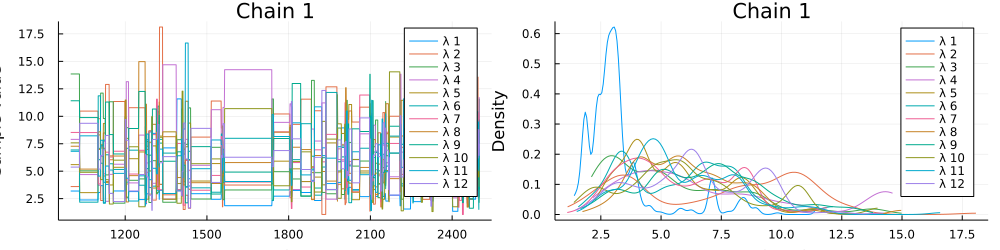

In [35]:
plotlambdaposteriorChainAndDensity(tchain1,burn,K);


In [36]:
λ_ids = getlambdaIDs(tchain1);

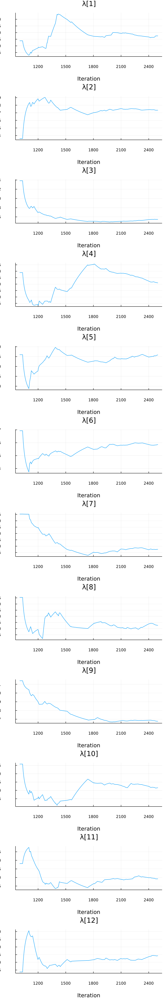

In [37]:
meanplot(tchain1[burn:end, λ_ids, :])


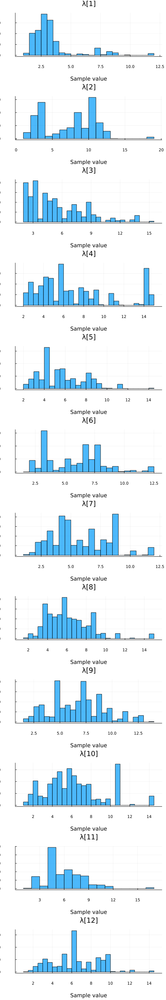

In [38]:
histogram(tchain1[burn:end, λ_ids, :])


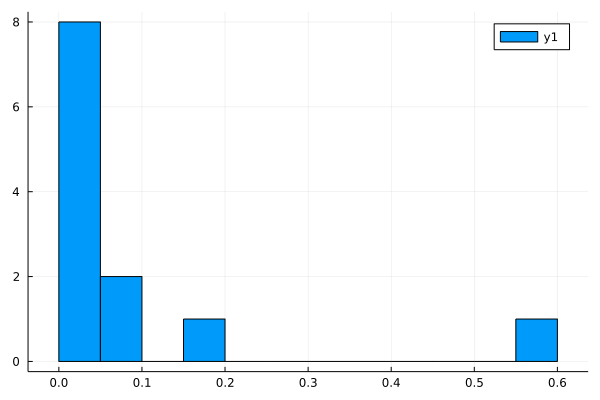

In [40]:
v_df = DataFrame(tchain1[iterations, MCMCChains.namesingroup(tchain1, :v), :])[!,3:end]
v_t_vec = [[v_df[!,j][1] for j in [m.match for m in match.(time_re_func(t,"v"),names(v_df)) if !isnothing(m) ]] for t in 1:T]
π_t_post = stickbreak.(v_t_vec)
histogram(π_t_post[1]) #Not as helpful!


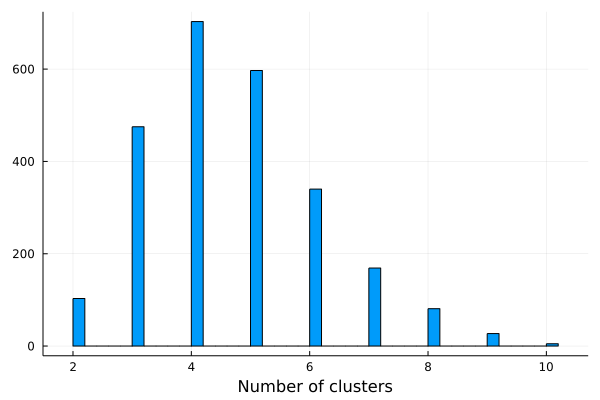

In [41]:
plotNumClusters(tchain1, iterations);

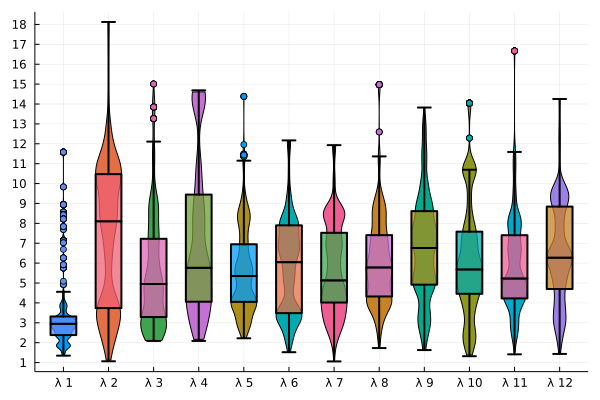

In [42]:
plotlambdaposteriorSamples(tchain1,burn,K);

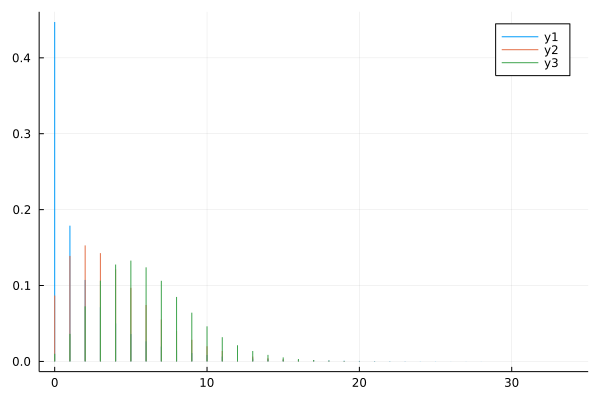

MixtureModel{NegativeBinomial{Float64}}(K = 3)
components[1] (prior = 0.3333): NegativeBinomial{Float64}(r=0.5, p=0.2)
components[2] (prior = 0.3333): NegativeBinomial{Float64}(r=2.6666666666666665, p=0.4)
components[3] (prior = 0.3333): NegativeBinomial{Float64}(r=9.0, p=0.6)


In [43]:
plotDataGeneratingDist(μ,σ²,[1/3,1/3,1/3])


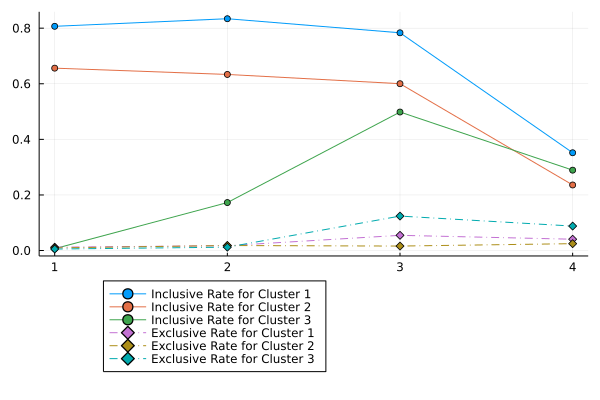

In [44]:
plotCorrectClusteringRates(tchain1,burn,T,true_k,truth_dict1);

### Data: 1 Gene NB likelihood mu = [2,10,20]; Model= independent DPs 

In [ ]:
k = 3
T = 4
Cₜ =  2*ones(Int,T) #[2,2,2,2]
μ = [2.,10.,20.]
σ² = 25.0*ones(k)
truth_dict2, data_dict2 = generate1Phen_SimpleCase1(μ =μ, σ² = σ²)

In [ ]:
C_t = [6,6,6,6]
burn = 1000  # NOTE: The burn in is also returned. Can't be discarded.
n_samples = 1500
PG_param = 100
# iterations = burn + n_samples
x2 = [[data_dict2[(i,t)][1] for i in 1:C_t[t]] for t in 1:T]
true_clusters2 = [[truth_dict2[(i,t)] for i in 1:C_t[t]] for t in 1:T]
coordinates2 = [[(i,t) for i in 1:C_t[t]] for t in 1:T]
K = 12
true_k = 3
T = 4
m2=timeseries_indep_dp_pmm1(x2, T, K)

In [ ]:
@time PG_chain2 = begin
    burnin = burn  # NOTE: The burn in is also returned. Can't be discarded.
    post_samples = n_samples
    iterations = burnin + post_samples
    PG_param = PG_param
 
    tchain2 = sample(m2, 
            PG(PG_param),
           iterations, progress=false)
end;

In [ ]:
plotNumClusters(tchain2, iterations);

In [ ]:
plotlambdaposteriorSamples(tchain2,burn,K);

In [ ]:
plotDataGeneratingDist(μ,σ²,[1/3,1/3,1/3])

In [ ]:
plotCorrectClusteringRates(tchain2,burn,T,true_k,truth_dict2);

### Data: 1 Gene NB likelihood mu = [2,4,6]; Model= independent DPs with fixed lambdas

In [3]:
k = 3
T = 4
Cₜ =  2*ones(Int,T) #[2,2,2,2]
μ = [2.,4.,6.]
σ² = 10.0*ones(k)
truth_dict3, data_dict3 = generate1Phen_SimpleCase1()
C_t = [6,6,6,6]

4-element Vector{Int64}:
 6
 6
 6
 6

In [7]:

burn = 1000  # NOTE: The burn in is also returned. Can't be discarded.
n_samples = 1500
PG_param = 100
# iterations = burn + n_samples
x = [[data_dict3[(i,t)][1] for i in 1:C_t[t]] for t in 1:T]
true_clusters = [[truth_dict3[(i,t)] for i in 1:C_t[t]] for t in 1:T]
coordinates = [[(i,t) for i in 1:C_t[t]] for t in 1:T]
K = 12
true_k = 3
trueλ = zeros(K)
for mu in 1:k
    trueλ[mu] = μ[mu]
end
T = 4
m3=timeseries_indep_dp_pmm1_fixedλ(x, T, K,trueλ)


DynamicPPL.Model{Main.InferenceUtils.turingInferenceModels.var"#7#9", (:x, :T, :K, :true_λ, :a_θ, :b_θ, :a, :b), (:a_θ, :b_θ, :a, :b), (), Tuple{Vector{Vector{Int64}}, Int64, Int64, Vector{Float64}, Int64, Int64, Int64, Int64}, NTuple{4, Int64}, DynamicPPL.DefaultContext}(:timeseries_indep_dp_pmm1_fixedλ, Main.InferenceUtils.turingInferenceModels.var"#7#9"(), (x = [[0, 4, 4, 5, 0, 3], [0, 0, 0, 5, 2, 9], [1, 2, 3, 1, 1, 2], [2, 2, 0, 5, 20, 3]], T = 4, K = 12, true_λ = [2.0, 4.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], a_θ = 1, b_θ = 1, a = 6, b = 1), (a_θ = 1, b_θ = 1, a = 6, b = 1), DynamicPPL.DefaultContext())

In [8]:
@time PG_chain = begin
    burnin = burn  # NOTE: The burn in is also returned. Can't be discarded.
    post_samples = n_samples
    iterations = burnin + post_samples
    PG_param = PG_param
 
    tchain = sample(m3, 
            PG(PG_param),
           iterations, progress=false)
end;

454.341576 seconds (1.43 G allocations: 157.085 GiB, 7.33% gc time, 3.70% compilation time)


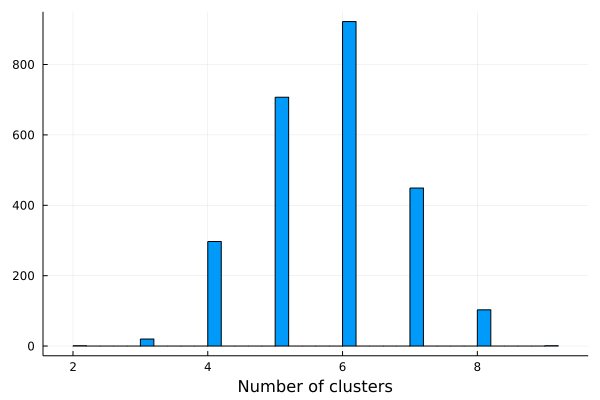

In [9]:
plotNumClusters(tchain, iterations);

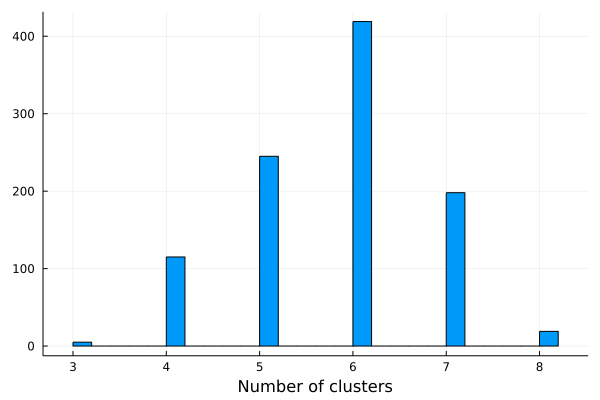

In [17]:
h = map(
            t -> length(unique(vec(tchain[t, MCMCChains.namesingroup(tchain, :z), :].value))), burn:iterations
            );
        #Posterior Over Clusters
clus_plot = histogram(h, xlabel = "Number of clusters", legend = false);
display(clus_plot)

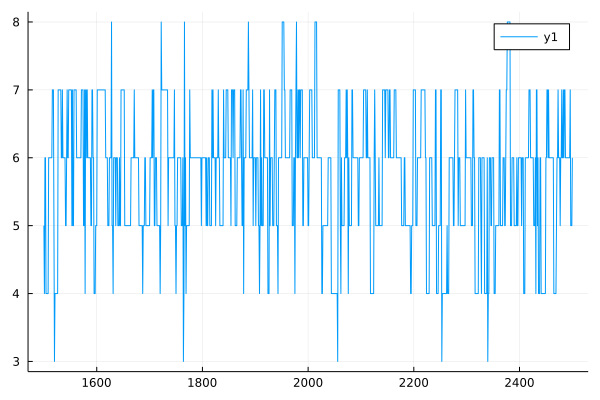

In [21]:
# ht = map(t -> (t,length(unique(vec(tchain[t, MCMCChains.namesingroup(tchain, :z), :].value)))), n_samples:iterations);
# itr = [el[1] for el in ht]
# clus_num = [el[2] for el in ht]
# plot(itr,clus_num)
plotNumClustersOverItr(tchain, burn, iterations)

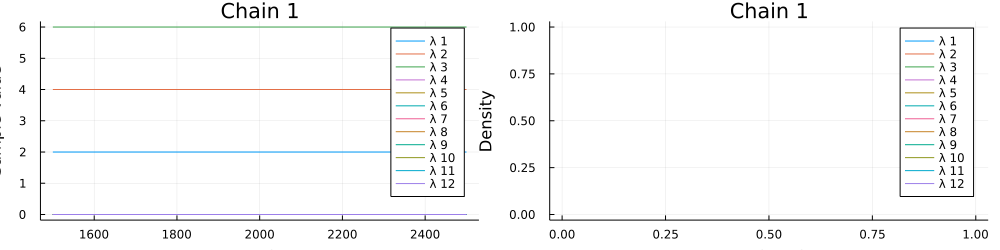

In [18]:
plotlambdaposteriorChainAndDensity(tchain,burn,K);

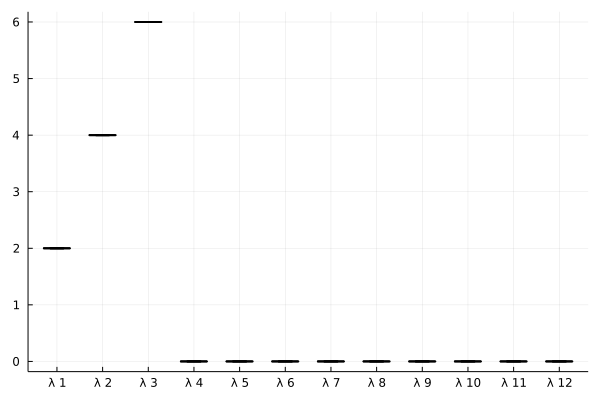

In [10]:
plotlambdaposteriorSamples(tchain,burn,K);

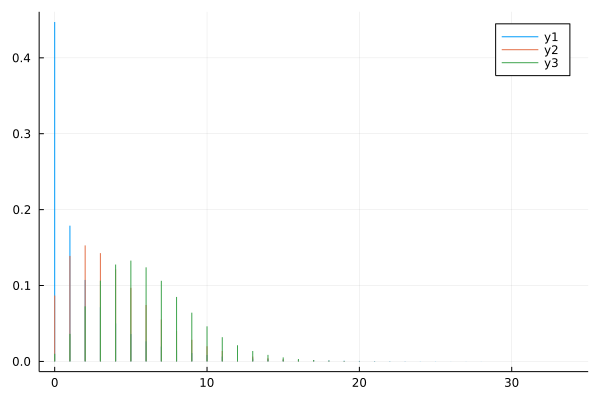

MixtureModel{NegativeBinomial{Float64}}(K = 3)
components[1] (prior = 0.3333): NegativeBinomial{Float64}(r=0.5, p=0.2)
components[2] (prior = 0.3333): NegativeBinomial{Float64}(r=2.6666666666666665, p=0.4)
components[3] (prior = 0.3333): NegativeBinomial{Float64}(r=9.0, p=0.6)


In [11]:
plotDataGeneratingDist(μ,σ²,[1/3,1/3,1/3])

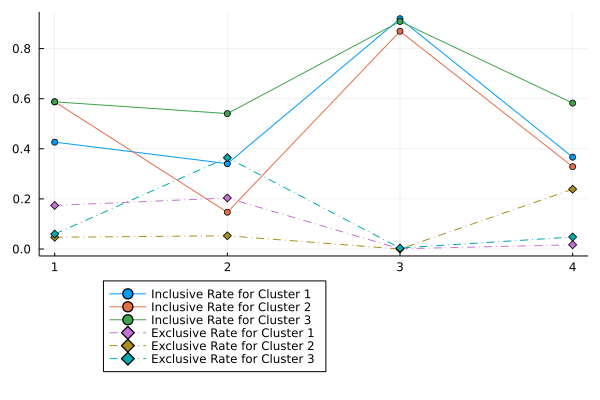

In [14]:
plotCorrectClusteringRates(tchain,burn,T,true_k,truth_dict3);

### RUNID:00001 Data: 1 Gene NB likelihood mu = [2,4,6]; Model= independent DPs with only 3 given states to the Inference algorithm not more

In [4]:
k = 3
T = 4
Cₜ =  2*ones(Int,T) #[2,2,2,2]
μ = [2.,4.,6.]
σ² = 10.0*ones(k)
truth_dict4, data_dict4 = generate1Phen_SimpleCase1()
C_t = [6,6,6,6]

4-element Vector{Int64}:
 6
 6
 6
 6

In [5]:
burn = 5000  # NOTE: The burn in is also returned. Can't be discarded.
n_samples = 25000
PG_param = 100
# iterations = burn + n_samples
x4 = [[data_dict4[(i,t)][1] for i in 1:C_t[t]] for t in 1:T]
true_clusters4 = [[truth_dict4[(i,t)] for i in 1:C_t[t]] for t in 1:T]
coordinates = [[(i,t) for i in 1:C_t[t]] for t in 1:T]
K = 3
true_k = 3
T = 4
m4=timeseries_indep_dp_pmm1(x4, T, K)

DynamicPPL.Model{Main.InferenceUtils.turingInferenceModels.var"#2#4", (:x, :T, :K, :a_θ, :b_θ, :a, :b), (:a_θ, :b_θ, :a, :b), (), Tuple{Vector{Vector{Int64}}, Int64, Int64, Int64, Int64, Int64, Int64}, NTuple{4, Int64}, DynamicPPL.DefaultContext}(:timeseries_indep_dp_pmm1, Main.InferenceUtils.turingInferenceModels.var"#2#4"(), (x = [[7, 0, 10, 0, 6, 1], [3, 6, 9, 5, 14, 1], [3, 6, 8, 5, 2, 7], [5, 1, 5, 3, 4, 9]], T = 4, K = 3, a_θ = 1, b_θ = 1, a = 6, b = 1), (a_θ = 1, b_θ = 1, a = 6, b = 1), DynamicPPL.DefaultContext())

In [6]:
@time PG_chain4 = begin
    burnin = burn  # NOTE: The burn in is also returned. Can't be discarded.
    post_samples = n_samples
    iterations = burnin + post_samples
    PG_param = PG_param
 
    tchain4 = sample(m4, 
            PG(PG_param),
           iterations, progress=false)
end;

4568.713745 seconds (14.00 G allocations: 1.465 TiB, 6.53% gc time, 0.37% compilation time)


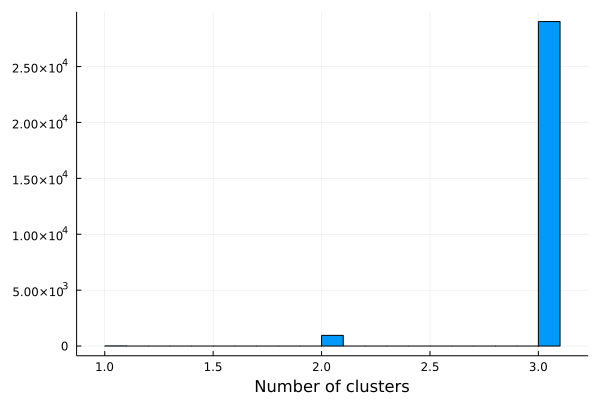

In [7]:
plotNumClusters(tchain4, iterations);

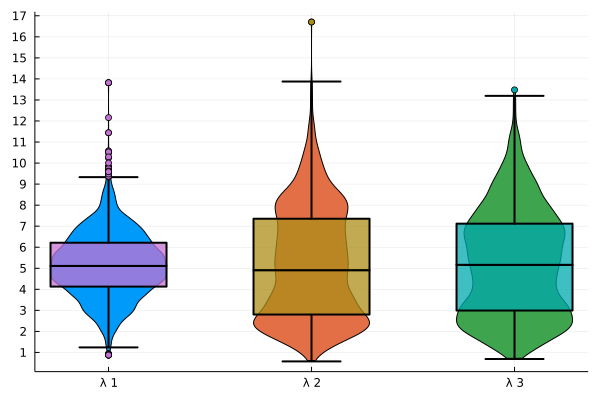

In [8]:
plotlambdaposteriorSamples(tchain4,n_samples,K);

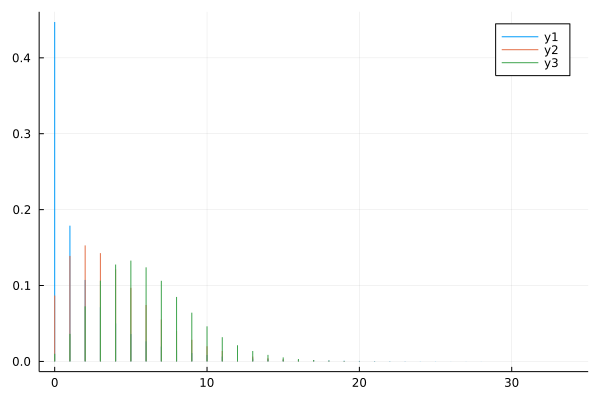

MixtureModel{NegativeBinomial{Float64}}(K = 3)
components[1] (prior = 0.3333): NegativeBinomial{Float64}(r=0.5, p=0.2)
components[2] (prior = 0.3333): NegativeBinomial{Float64}(r=2.6666666666666665, p=0.4)
components[3] (prior = 0.3333): NegativeBinomial{Float64}(r=9.0, p=0.6)


In [9]:
plotDataGeneratingDist(μ,σ²,[1/3,1/3,1/3])

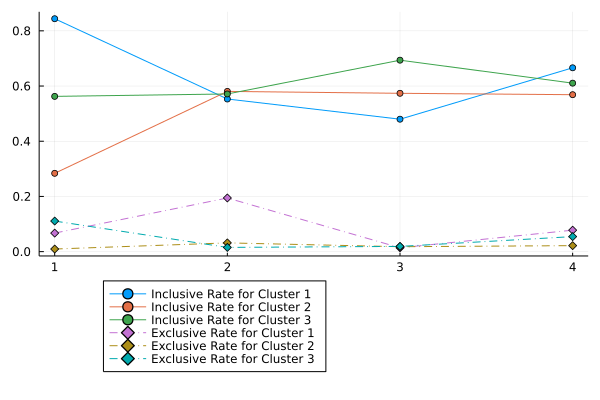

In [15]:
plotCorrectClusteringRates(tchain4,burn,T,true_k,truth_dict4);

In [11]:
# write("runid00001-chain-file.jls", tchain4) # Want to try and is this for fixing the identifiability problem

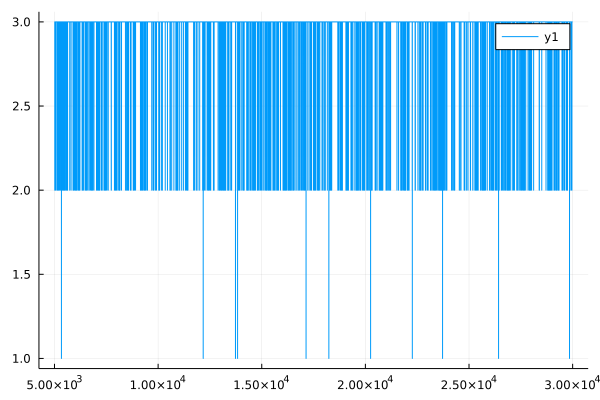

In [14]:
plotNumClustersOverItr(tchain4, burn, iterations);

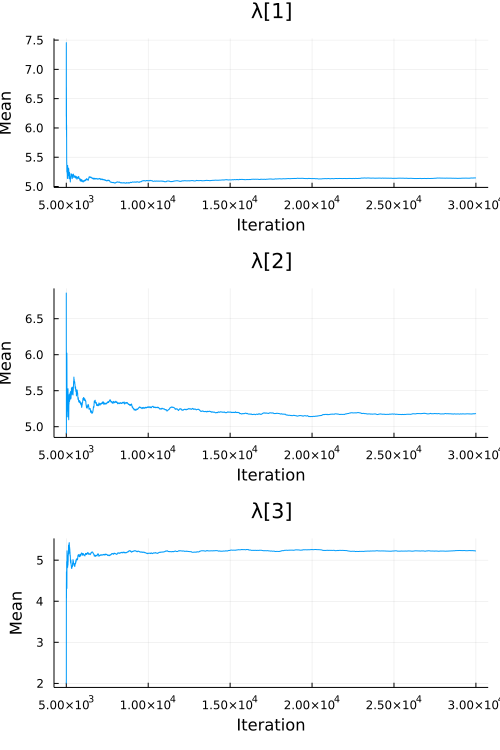

In [17]:
λ_ids = getlambdaIDs(tchain4);
meanplot(tchain4[burn:end, λ_ids, :])

In [18]:
exclusive_rate, inclusive_rate = getEmpricalCorrectClusteringRates(tchain4,burn,T,k,truth_dict4)

([[0.0671573137074517, 0.19443222271109156, 0.013959441622335107, 0.07779688812447502], [0.009439622415103396, 0.031678732850685974, 0.017879284828606856, 0.02171913123475061], [0.11083556657733691, 0.01531938722451102, 0.018959241630334786, 0.054437822487100516]], [[0.843926242950282, 0.5530178792848286, 0.47986080556777727, 0.6661333546658134], [0.2837886484540618, 0.5806167753289868, 0.5736970521179153, 0.5686572537098517], [0.56253749850006, 0.5712971481140754, 0.6936922523099076, 0.610455581776729]])

In [20]:
z_df = getzDF(tchain4,burn)
num_itr = size(z_df)[1]

25001

In [24]:
exclusive_rate .* num_itr

3-element Vector{Vector{Float64}}:
 [1679.0, 4861.0, 349.0, 1945.0]
 [236.0, 792.0, 447.0, 543.0]
 [2771.0, 383.0, 474.0, 1361.0]

In [25]:
inclusive_rate .* num_itr

3-element Vector{Vector{Float64}}:
 [21099.0, 13826.0, 11997.0, 16654.0]
 [7095.0, 14516.0, 14343.000000000002, 14217.000000000002]
 [14064.0, 14282.999999999998, 17343.0, 15262.000000000002]

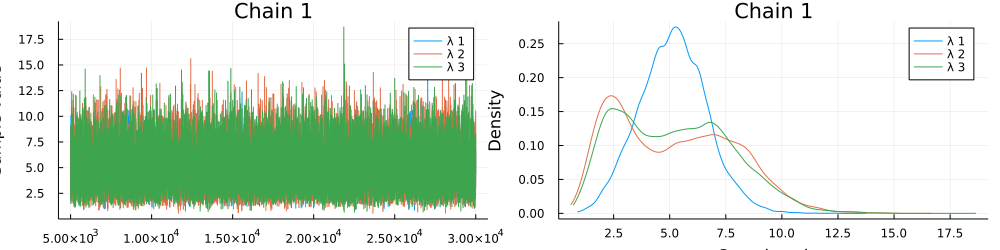

In [26]:
plotlambdaposteriorChainAndDensity(tchain4,burn,K);

In [27]:
1/45

0.022222222222222223

In [45]:
1/15*1/3

0.022222222222222223

In [29]:
mean.(exclusive_rate)


3-element Vector{Float64}:
 0.08833646654133834
 0.02017919283228671
 0.049888004479820815

In [ ]:
v_df = DataFrame(tchain4[5000:end, MCMCChains.namesingroup(tchain4, :v), :])[!,3:end]
v_t_vec = [[[r[j][1] for j in [m.match for m in match.(time_re_func(t,"v"),names(r)) if !isnothing(m) ]] for t in 1:T] for r in eachrow(v_df)]
π_t_post = [stickbreak.(itr) for itr in v_t_vec]
λdf =  getlambdaposteriorDF(tchain4,5000)
param_lh = [Poisson.(collect(r)) for r in eachrow(λdf)]

In [79]:
λdf =  getlambdaposteriorDF(tchain4,5000)
param_lh = [Poisson.(collect(r)) for r in eachrow(λdf)]
cell_lhprob =[[[pdf.(itr_lh,x4[t][c]) for c in 1:C_t[t]] for t in 1:T] for itr_lh in param_lh]

25001-element Vector{Vector{Vector{Vector{Float64}}}}:
 [[[0.14170357749659834, 0.14879729590350232, 0.004235131450141771], [0.0020404527589902594, 0.0010469003939996147, 0.12417855500217498], [0.04678263333931017, 0.06677282892726352, 5.339480922113195e-5], [0.0020404527589902594, 0.0010469003939996147, 0.12417855500217498], [0.16012780095029763, 0.15179145861775734, 0.014211613488523834], [0.012639755105737671, 0.007183748307591618, 0.2590407858356753]], [[0.08083727027059706, 0.056375622006804765, 0.18787110620073047], [0.16012780095029763, 0.15179145861775734, 0.014211613488523834], [0.0755218376238106, 0.09730922899755204, 0.0002559631770845186], [0.15509788465368038, 0.13272503241638364, 0.040876442407964515], [0.0028673968640953638, 0.006162223349499058, 4.2086218730830086e-8], [0.012639755105737671, 0.007183748307591618, 0.2590407858356753]], [[0.08083727027059706, 0.056375622006804765, 0.18787110620073047], [0.16012780095029763, 0.15179145861775734, 0.014211613488523834], [0.1

In [123]:
P = Vector{Vector{Vector{Vector{Float64}}}}(undef, size(cell_lhprob)[1])
# for itr_ in 1:size(cell_lhprob)[1]
#     for t in 1:T
#         for c in 1:C_t[t]
#             pnl = π_t_post[itr_][t] .* cell_lhprob[itr_][t][c]
#             P[itr_][t][c] = softmax(pnl)
#         end
#     end
# end
for itr_ in 1:size(cell_lhprob)[1]
    P[itr_] = [[ π_t_post[itr_][t] .* cell_lhprob[itr_][t][c] ./ sum(π_t_post[itr_][t] .* cell_lhprob[itr_][t][c]) for c in 1:C_t[t]] for t in 1:T ]
end

In [124]:
P[1]

4-element Vector{Vector{Vector{Float64}}}:
 [[0.2092292404389717, 0.7501383057118024, 0.04063245384922598], [0.002511329321175405, 0.004399336955514103, 0.9930893337233105], [0.17004838522202684, 0.8286905091036731, 0.0012611056742999757], [0.002511329321175405, 0.004399336955514103, 0.9930893337233105], [0.20775935911048013, 0.6724282216493798, 0.11981241924014005], [0.007347174791312245, 0.014257308954993499, 0.9783955162536941]]
 [[0.040958361430078236, 0.001430252717210616, 0.9576113858527112], [0.5153822047006464, 0.02446248173620144, 0.46015531356315226], [0.9102389132248818, 0.05872558899307712, 0.0310354977820411], [0.2706953571526812, 0.011598939231605057, 0.7177057036157136], [0.9027270459797645, 0.09713966114671031, 0.0001332928735250351], [0.0048262642886466945, 0.00013734537809462517, 0.9950363903332586]]
 [[0.08407777611684722, 0.005571636301898282, 0.9103505875812545], [0.6650900453480981, 0.059907732097056396, 0.27500222255484547], [0.863993043180113, 0.0954948466315128

In [125]:
P[end]

4-element Vector{Vector{Vector{Float64}}}:
 [[0.45823678933134787, 0.2503832154500309, 0.29137999521862135], [0.011492326202939688, 0.9808734477371688, 0.007634226059891532], [0.5928447098647348, 0.037179491640729756, 0.36997579849453543], [0.011492326202939688, 0.9808734477371688, 0.007634226059891532], [0.3617682195199905, 0.4067522134866457, 0.23147956699336372], [0.023181182982378208, 0.9615156895441344, 0.015303127473487414]]
 [[0.22336338771444186, 0.7656795086603263, 0.010957103625231909], [0.693679529748693, 0.27292364003341646, 0.033396830217890555], [0.915408695019074, 0.04133753244688227, 0.04325377253404371], [0.5382019217998028, 0.4357242929348556, 0.02607378526534182], [0.9550896908607504, 0.0011691020049594317, 0.04374120713429023], [0.06424992462612855, 0.93255867461204, 0.0031914007618314612]]
 [[0.16145246974966554, 0.6587858471258513, 0.17976168312448304], [0.3904633471838033, 0.18286352194738897, 0.4266731308688077], [0.45666762194572896, 0.050510134039838964, 0.492

1.0